In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="darkgrid" )

In [2]:
prob = pd.read_csv('ClassificationProblem1.txt', delimiter = '\t', index_col = 'Index', parse_dates = ['F15', 'F16'])

In [3]:
prob.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F14,F15,F16,F17,F18,F19,F20,F21,F22,C
Index,,,,,,,,,,,,,,,,,,,,,
1,0.224506,0.500340,0.489860,0.902413,7934,-6970,-5714,9982,-5697,4227810299,...,-3433637453,1986-10-04,1992-09-06,2,1,706,305,1,2,0
2,0.321128,0.281119,0.907283,0.772159,-8238,1219,1663,1287,-3658,-1146724819,...,609277486,1979-02-24,1983-01-05,1,1,423,206,18,7,1
3,0.893441,0.622005,0.998776,0.098386,8540,5266,-9377,-3504,-4511,5947184989,...,-8977995005,1989-01-12,1986-11-22,2,1,703,315,1,4,0
4,0.320641,0.957234,0.346000,0.646479,-7772,-383,9681,-8661,3474,-5724795826,...,4868760308,1982-02-18,1992-06-10,1,1,122,304,15,1,0
5,0.475961,0.623008,0.544988,0.159709,1571,-8039,-7961,-2385,4407,-3097637172,...,9757408267,1987-04-10,1985-10-19,1,1,486,240,1,1,0


In [4]:
prob.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101180 entries, 1 to 101180
Data columns (total 23 columns):
F1     101180 non-null float64
F2     101180 non-null float64
F3     101180 non-null float64
F4     101180 non-null float64
F5     101180 non-null int64
F6     101180 non-null int64
F7     101180 non-null int64
F8     101180 non-null int64
F9     101180 non-null int64
F10    101180 non-null int64
F11    101180 non-null int64
F12    101180 non-null int64
F13    101180 non-null int64
F14    101180 non-null int64
F15    101180 non-null datetime64[ns]
F16    101180 non-null datetime64[ns]
F17    101180 non-null int64
F18    101180 non-null int64
F19    101180 non-null int64
F20    101180 non-null int64
F21    101180 non-null int64
F22    101180 non-null int64
C      101180 non-null int64
dtypes: datetime64[ns](2), float64(4), int64(17)
memory usage: 18.5 MB


In [5]:
prob['C_string'] = np.where(prob['C']==1, 'True', 'False')

In [6]:
prob['F23']=(prob.F15-prob.F16).astype('timedelta64[D]')

<h1>Univariate/Bivariate Analysis</h1>

In [7]:
prob.describe()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F13,F14,F17,F18,F19,F20,F21,F22,C,F23
count,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,1.011800e+05,...,1.011800e+05,1.011800e+05,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000,101180.000000
mean,0.502348,0.501497,0.499886,0.499839,-29.742617,1.511000,7.939118,16.434147,9.927812,1.869749e+07,...,1.127538e+07,-5.198163e+07,1.339593,1.335027,387.181479,387.333999,4.588031,4.598567,0.245375,-1093.001285
std,0.288058,0.289017,0.288875,0.288729,5781.829379,5796.594007,5765.581875,5782.805211,5771.004738,5.769064e+09,...,5.786659e+09,5.782358e+09,0.894065,0.882435,235.939585,235.374285,4.775671,4.776494,0.430311,1830.067077
min,0.000018,0.000004,0.000002,0.000006,-10000.000000,-10000.000000,-10000.000000,-10000.000000,-10000.000000,-9.999816e+09,...,-9.999852e+09,-9.999767e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-8893.000000
25%,0.253819,0.251115,0.248818,0.250501,-5045.000000,-5012.000000,-4979.000000,-4988.000000,-4992.250000,-4.966961e+09,...,-5.027003e+09,-5.070403e+09,1.000000,1.000000,187.000000,187.000000,1.000000,1.000000,0.000000,-2327.000000
50%,0.501802,0.501095,0.499820,0.501387,-46.000000,-11.500000,16.500000,60.000000,22.500000,4.346691e+07,...,9.416236e+06,-8.816174e+07,1.000000,1.000000,374.000000,375.000000,3.000000,3.000000,0.000000,-1095.000000
75%,0.753598,0.752404,0.750281,0.748803,4978.000000,5050.000000,4962.000000,5021.000000,5020.000000,5.019440e+09,...,5.032947e+09,4.947133e+09,1.000000,1.000000,560.000000,561.000000,7.000000,7.000000,0.000000,141.000000
max,0.999986,0.999990,0.999985,0.999977,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,9.999497e+09,...,9.999951e+09,9.999997e+09,6.000000,6.000000,901.000000,901.000000,21.000000,21.000000,1.000000,6779.000000


In [6]:
prob.C.mean()

0.24537457995651316

which indicates only 24.54% of the data has value of C=1

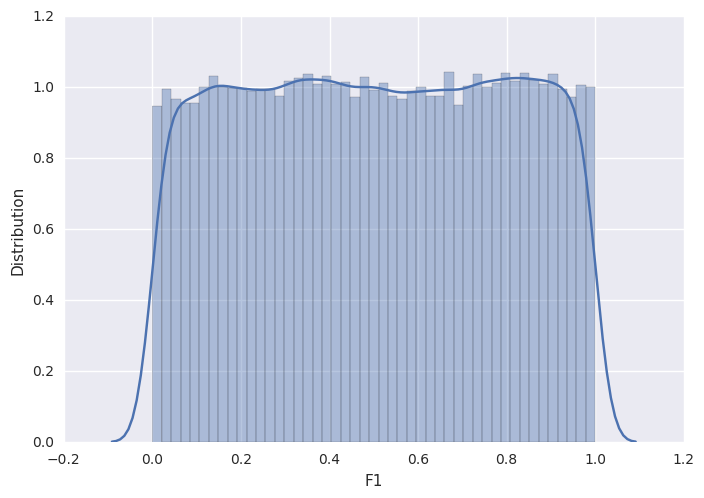

In [7]:
sns.distplot(prob.F1).set(ylabel='Distribution')

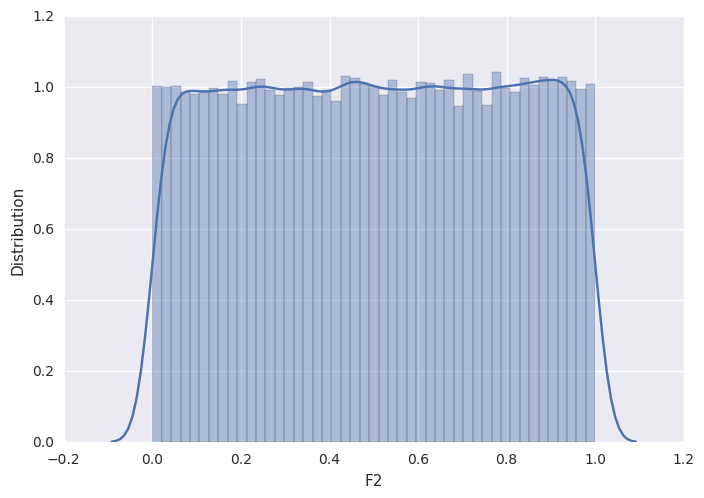

In [8]:
sns.distplot(prob.F2).set(ylabel='Distribution')

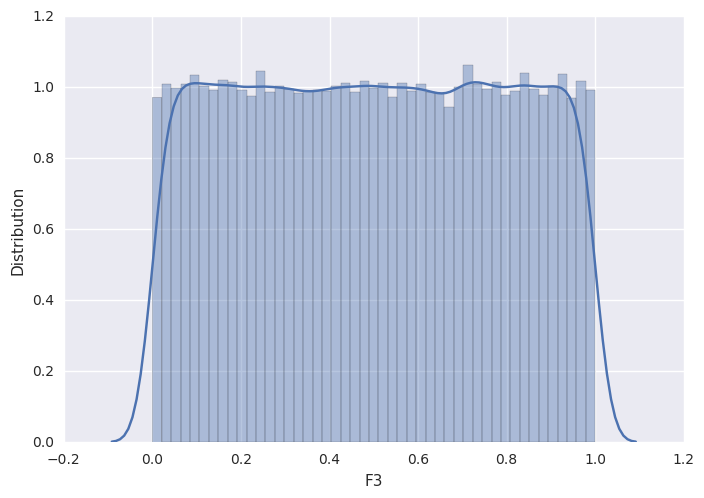

In [9]:
sns.distplot(prob.F3).set(ylabel='Distribution')

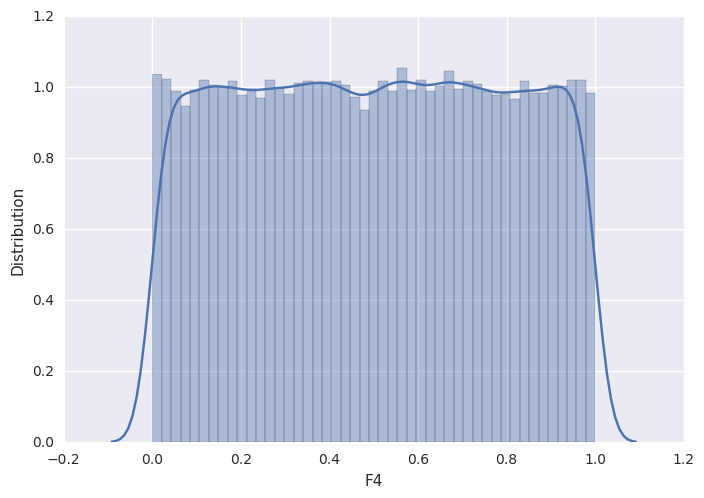

In [10]:
sns.distplot(prob.F4).set(ylabel='Distribution')

In [4]:
prob['C_string'] = np.where(prob['C']==1, 'True', 'False')

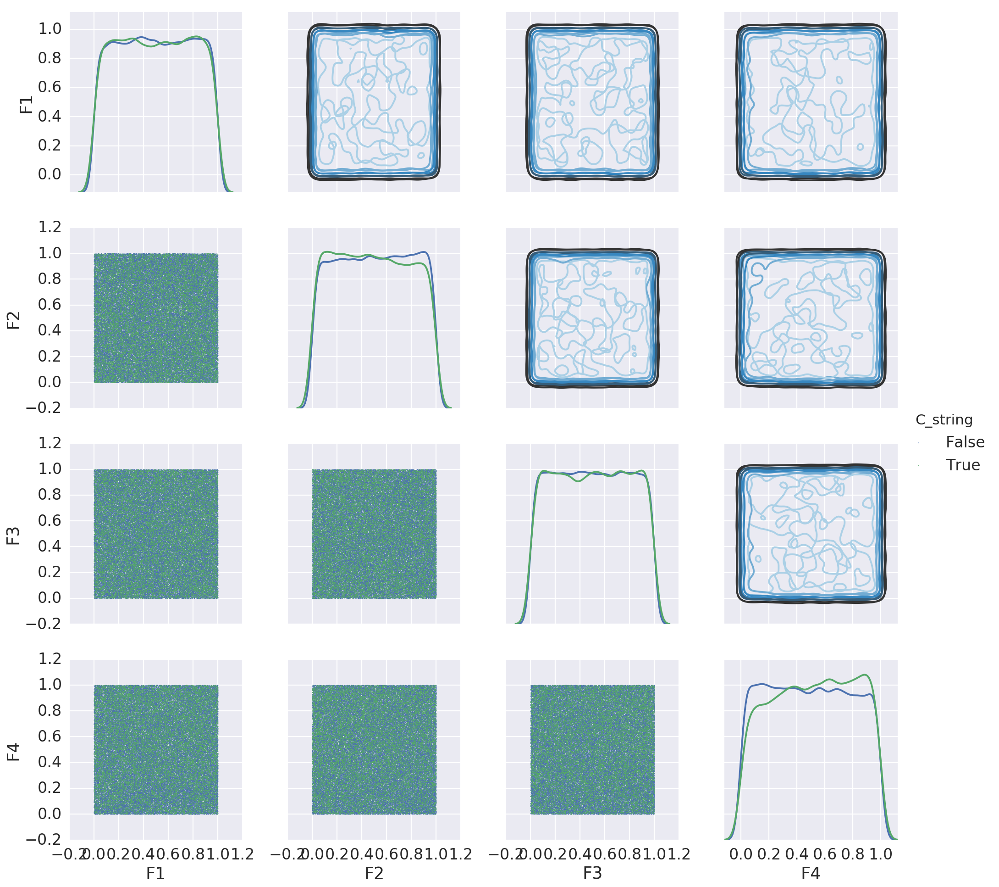

In [28]:
with sns.plotting_context("poster", font_scale=1.5):   
    g = sns.PairGrid(prob[["F1", "F2", "F3", "F4","C_string"]], hue="C_string", size=5)
    g = g.map_diag(sns.kdeplot)
    try:
        g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
        g = g.map_lower(plt.scatter, s=0.5)
    except ValueError:
        g = g.map_offdiag(plt.scatter, s=0.5)
    g.add_legend()
    g.savefig('1234C.jpg')

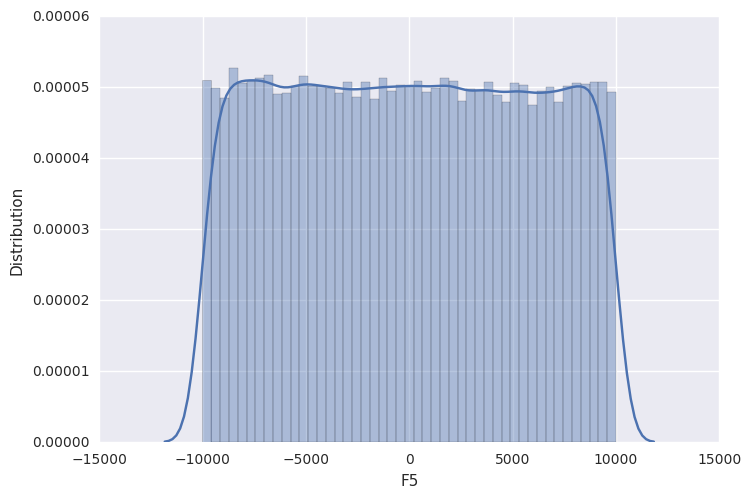

In [12]:
sns.distplot(prob.F5).set(ylabel='Distribution')

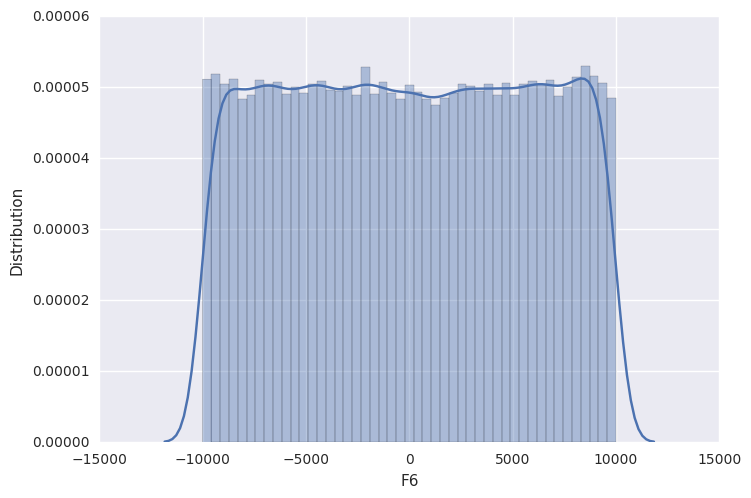

In [13]:
sns.distplot(prob.F6).set(ylabel='Distribution')

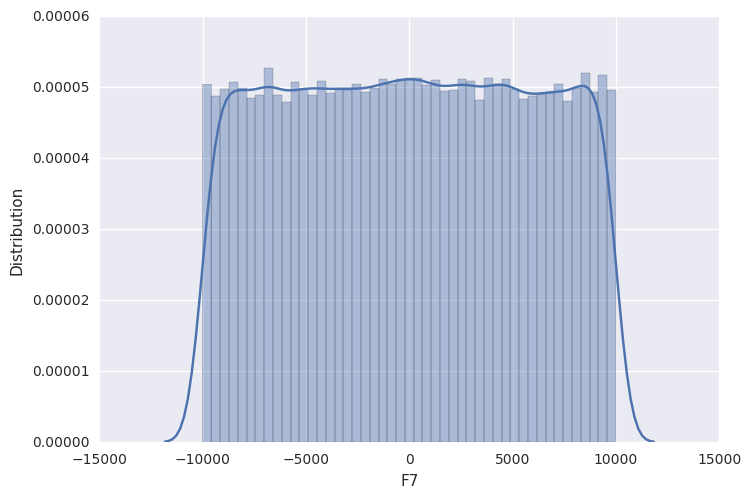

In [14]:
sns.distplot(prob.F7).set(ylabel='Distribution')

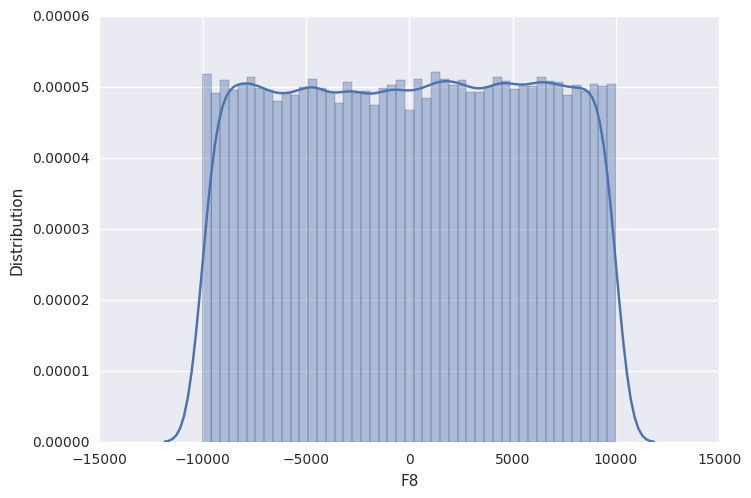

In [15]:
sns.distplot(prob.F8).set(ylabel='Distribution')

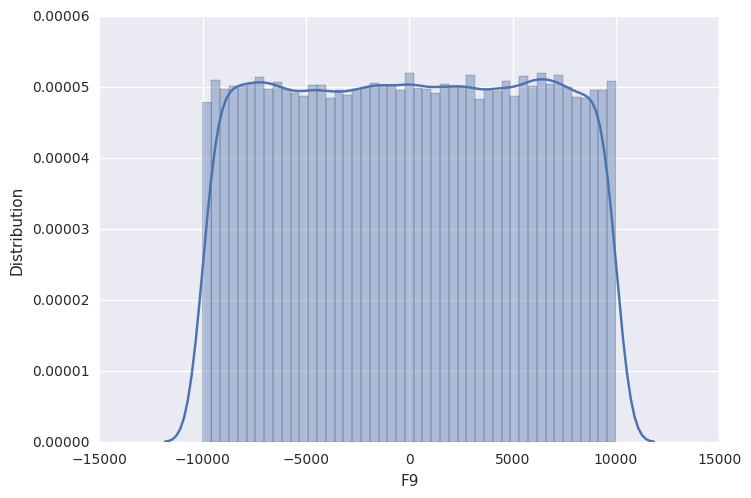

In [16]:
sns.distplot(prob.F9).set(ylabel='Distribution')

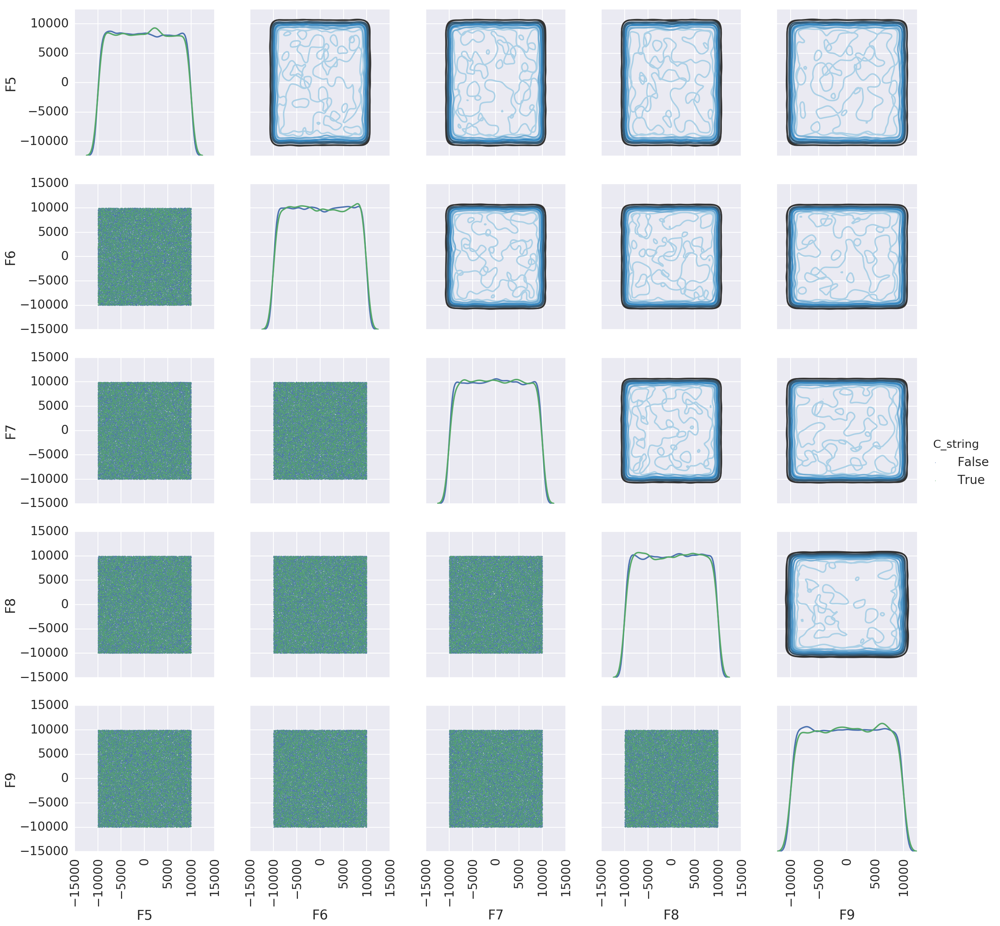

In [17]:
with sns.plotting_context("poster", font_scale=1.5):   
    g = sns.PairGrid(prob[["F5", "F6", "F7", "F8","F9", "C_string"]], hue="C_string", size=5)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=0.5)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('56789C.jpg')

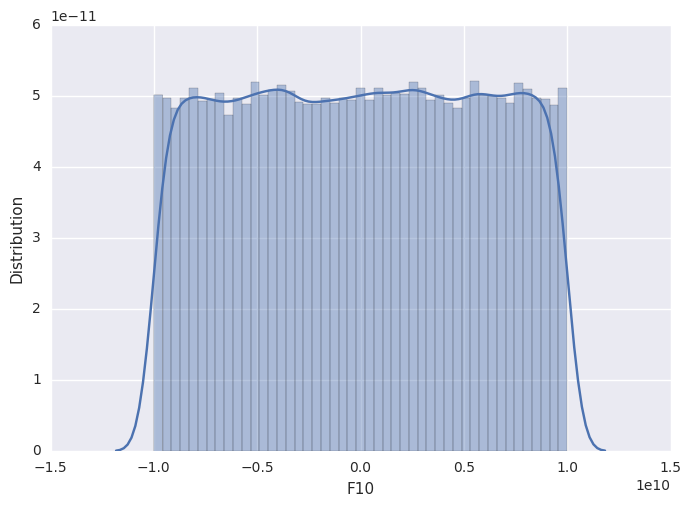

In [ ]:
sns.distplot(prob.F10).set(ylabel='Distribution')

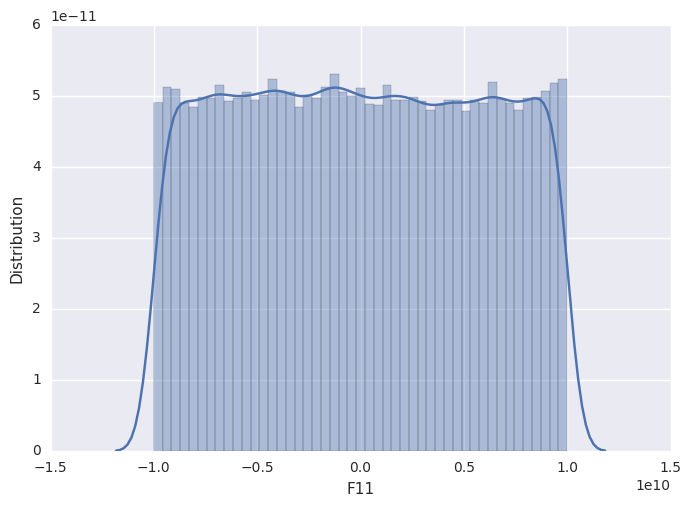

In [ ]:
sns.distplot(prob.F11).set(ylabel='Distribution')

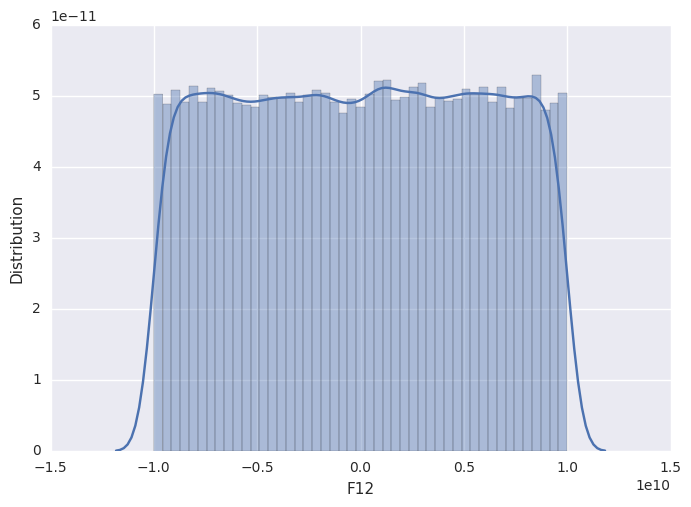

In [ ]:
sns.distplot(prob.F12).set(ylabel='Distribution')

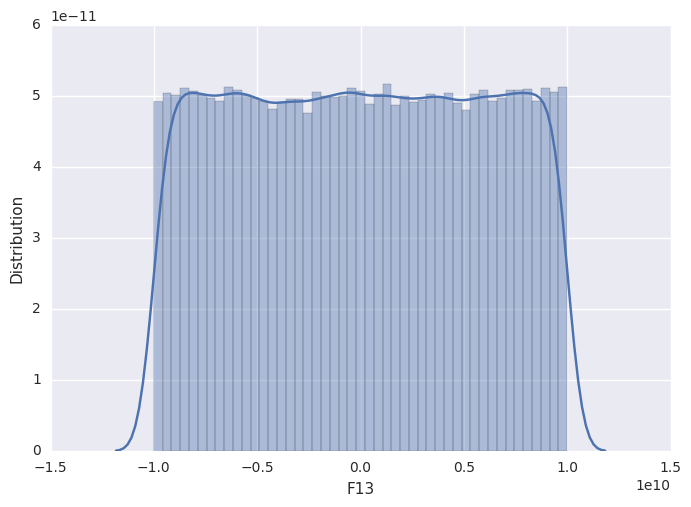

In [ ]:
sns.distplot(prob.F13).set(ylabel='Distribution')

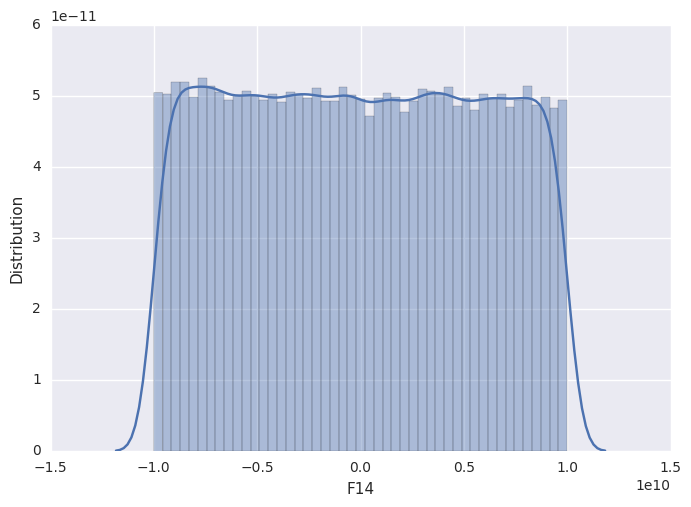

In [ ]:
sns.distplot(prob.F14).set(ylabel='Distribution')

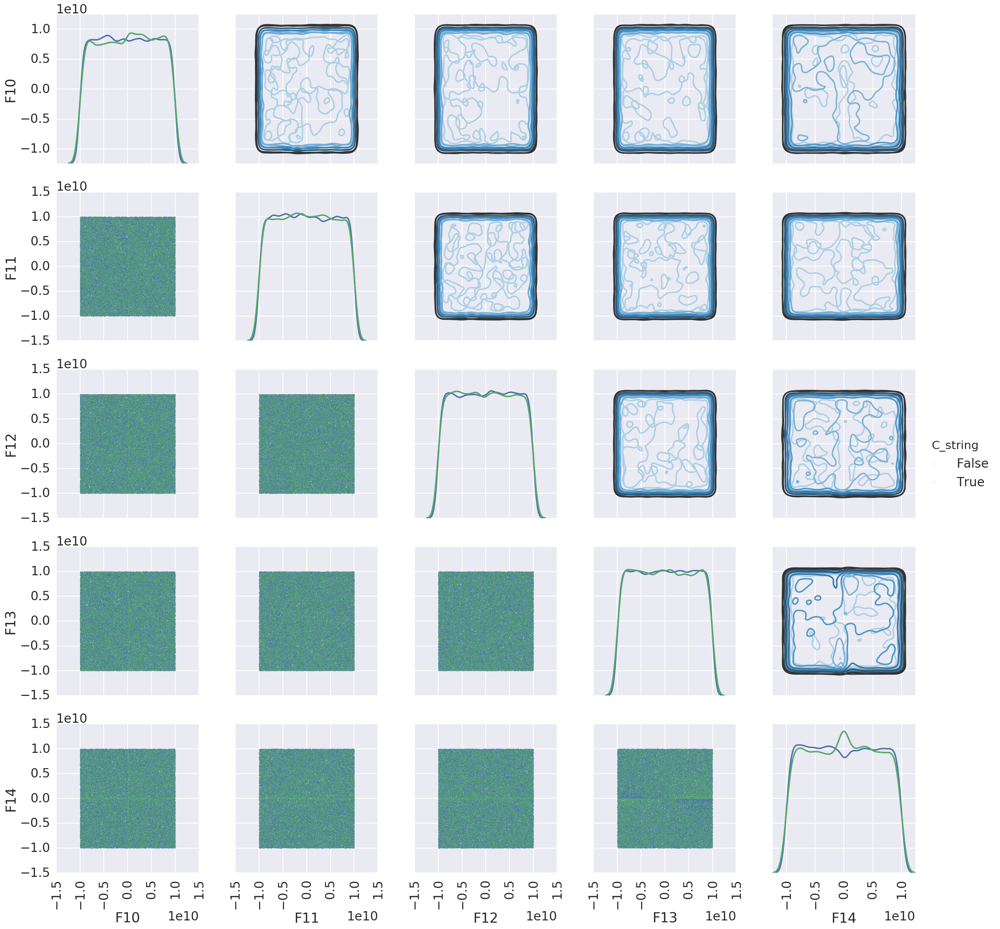

In [19]:
with sns.plotting_context("poster", font_scale=1.5):   
    g = sns.PairGrid(prob[["F10", "F11", "F12", "F13","F14", "C_string"]], hue="C_string", size=5)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=0.5)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('1011121314C.jpg')

In [5]:
prob['F23']=(prob.F15-prob.F16).astype('timedelta64[D]')

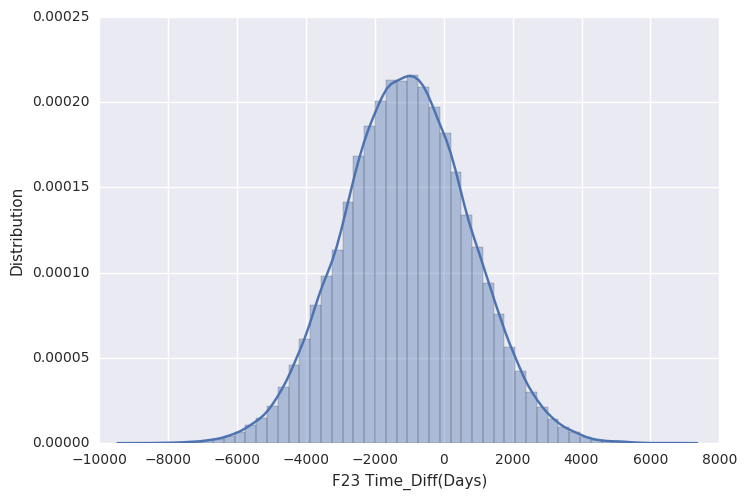

In [33]:
sns.distplot(prob.F23).set(ylabel='Distribution', xlabel='F23 Time_Diff(Days)')

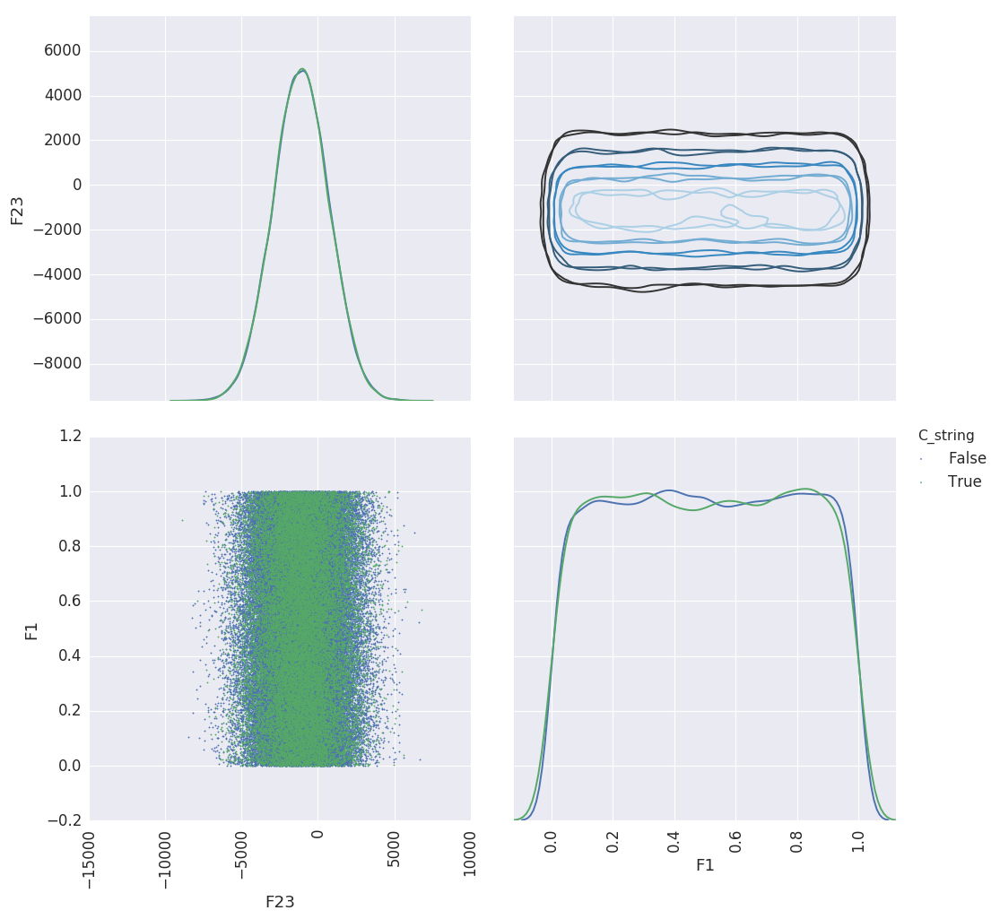

In [35]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F1", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=1)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('231C.jpg')

In [39]:
def plot_vs_F23(F):
    with sns.plotting_context("paper", font_scale=1.5):   
        g = sns.PairGrid(prob[["F23", F, "C_string"]], hue="C_string", size=5, diag_sharey=False)
        g = g.map_diag(sns.kdeplot)
        g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
        g = g.map_lower(plt.scatter, s=1)
        g.add_legend()
        for ax in g.axes.flat:
            for label in ax.get_xticklabels():
                label.set_rotation(90)
        g.savefig('23' +F[1:] + 'C.jpg')

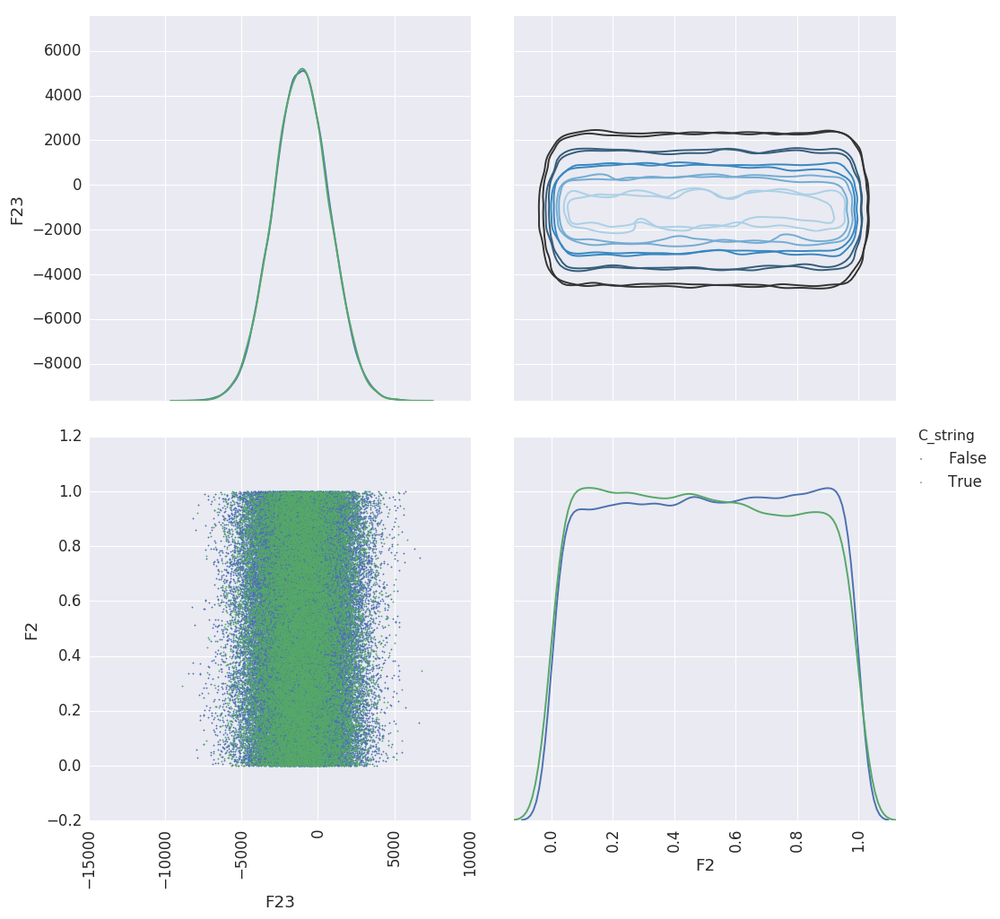

In [36]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F2", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=1)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('232C.jpg')

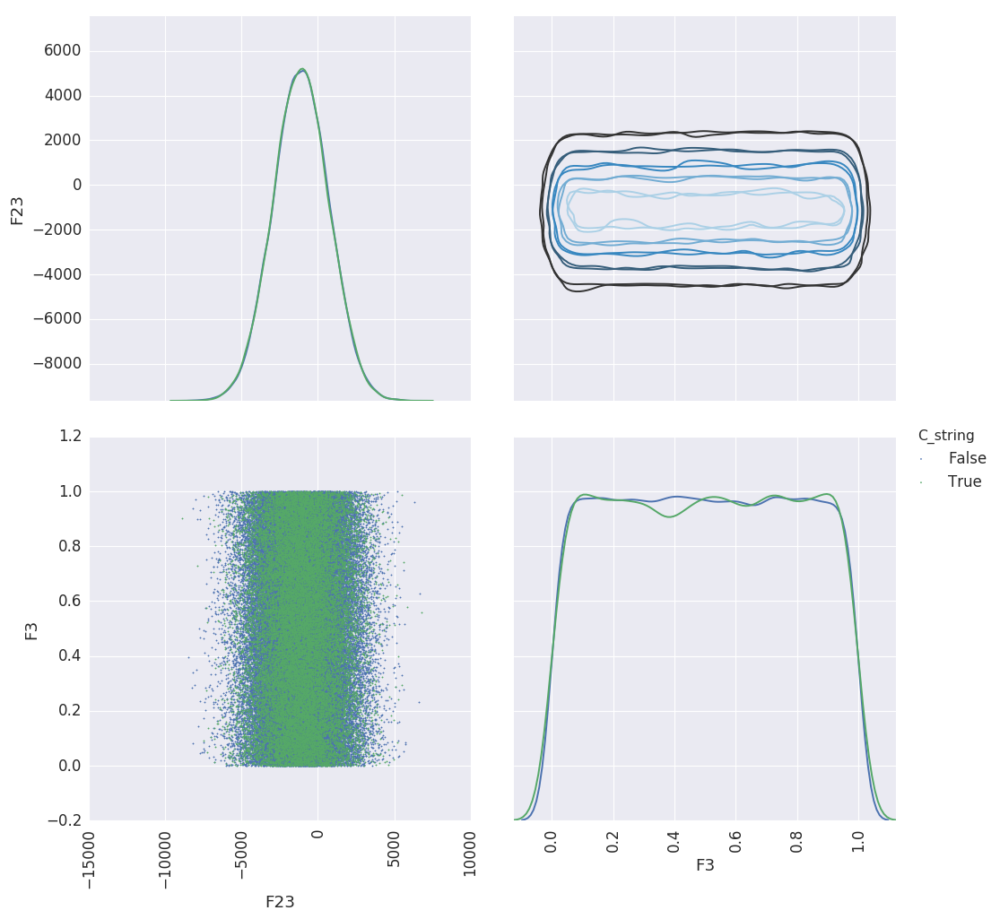

In [37]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F3", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=1)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('233C.jpg')

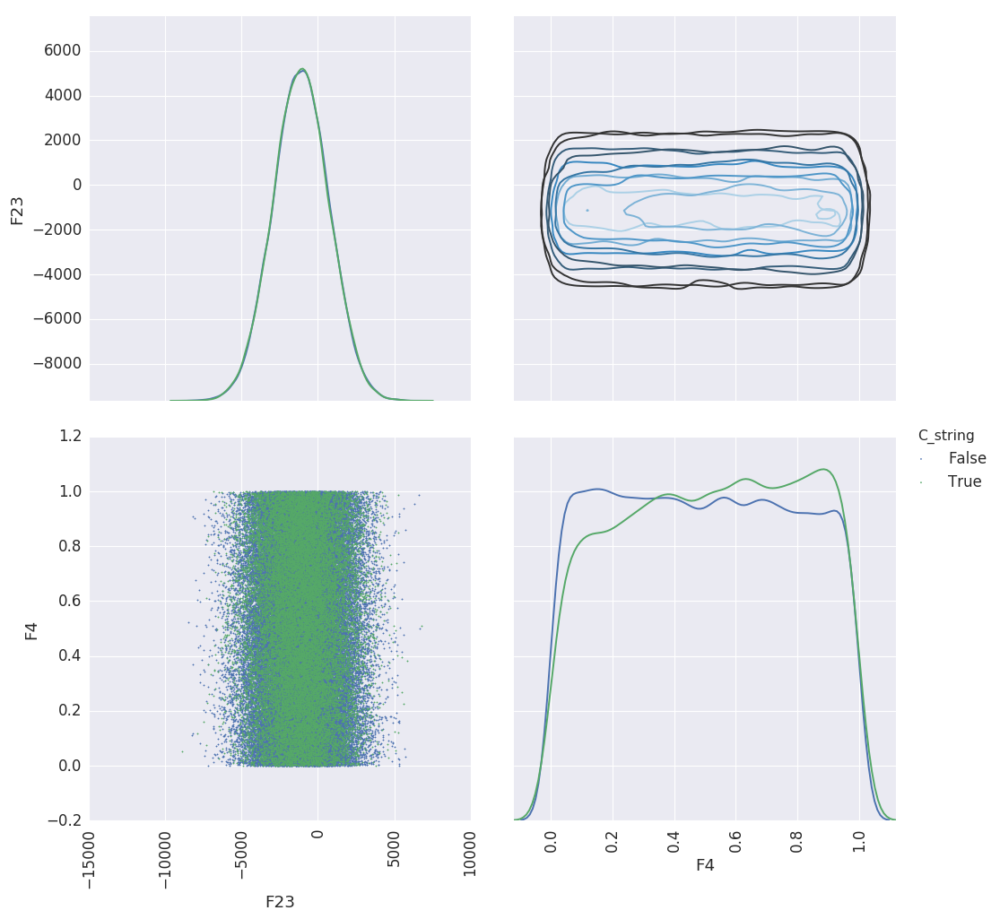

In [38]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F4", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(sns.kdeplot)
    g = g.map_upper(sns.kdeplot, cmap = "Blues_d", n_levels=6)
    g = g.map_lower(plt.scatter, s=1)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('234C.jpg')

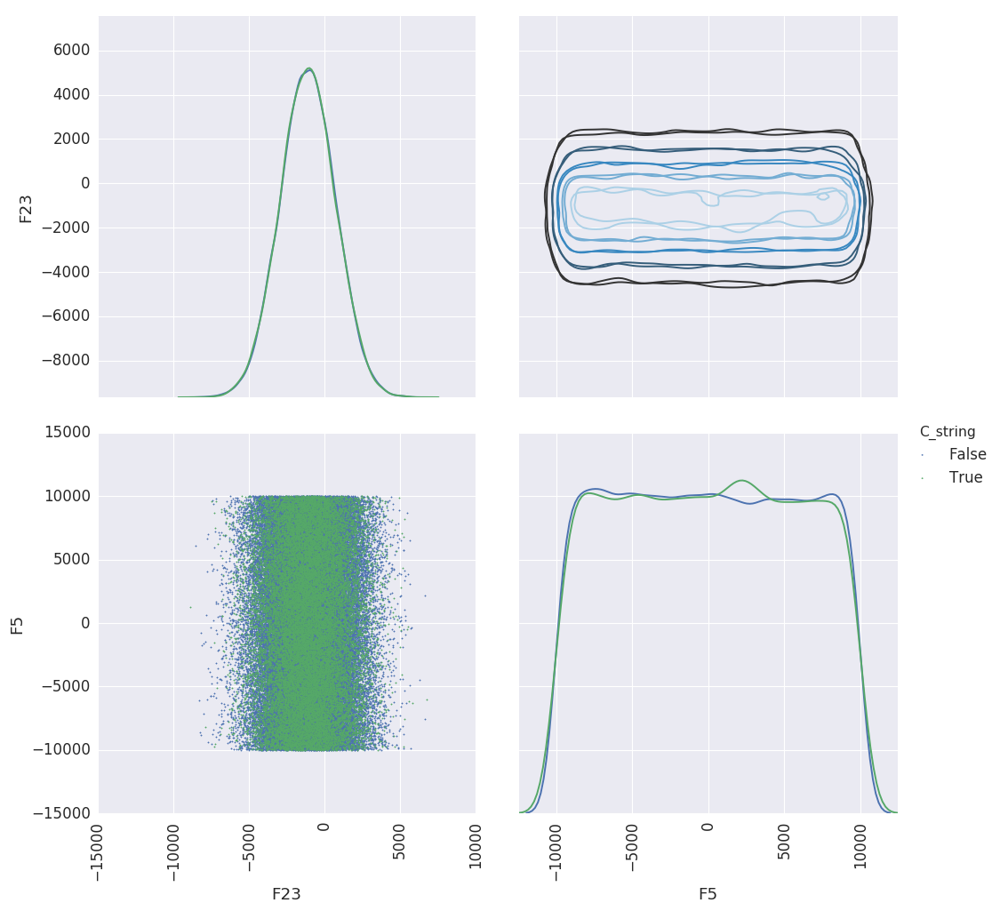

In [40]:
plot_vs_F23("F5")

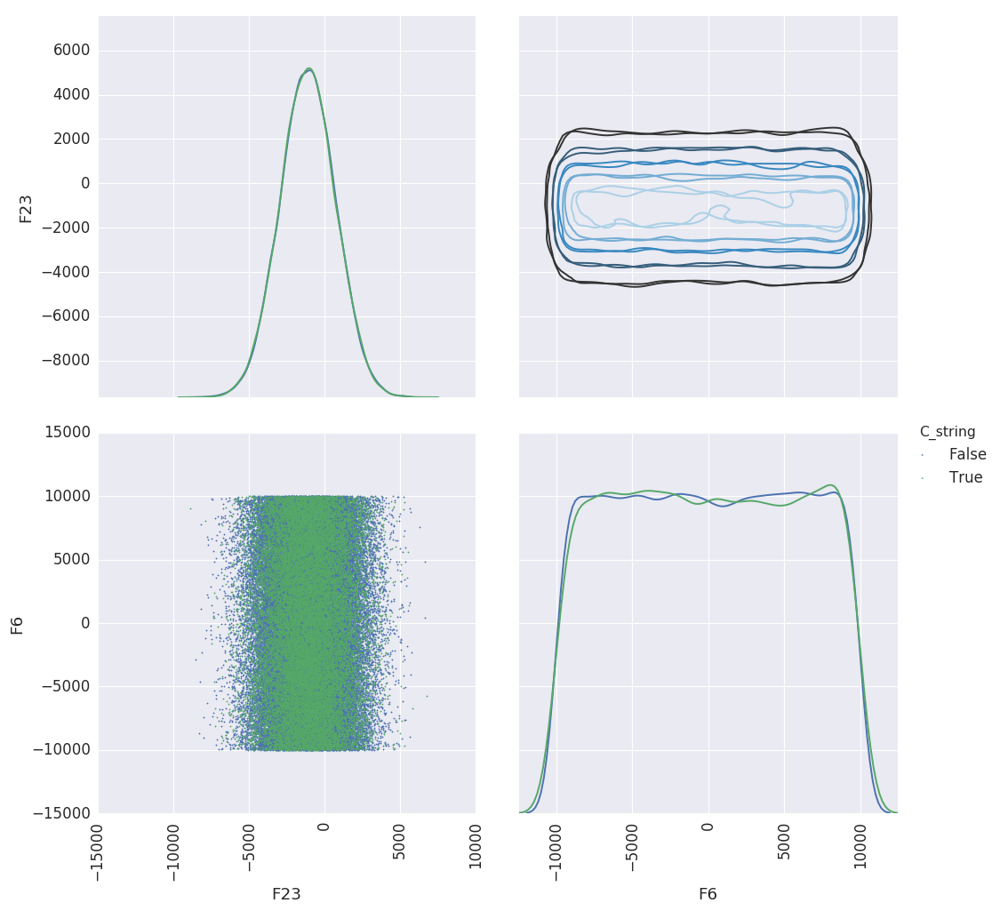

In [41]:
plot_vs_F23("F6")

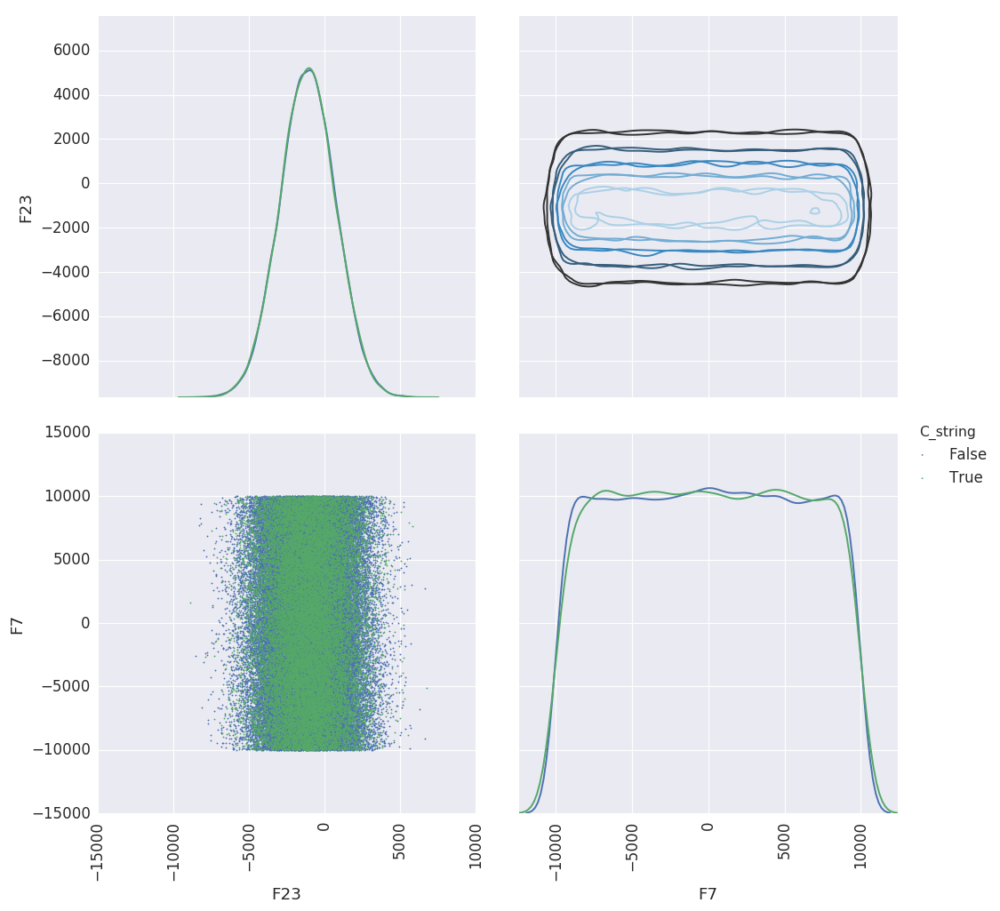

In [42]:
plot_vs_F23("F7")

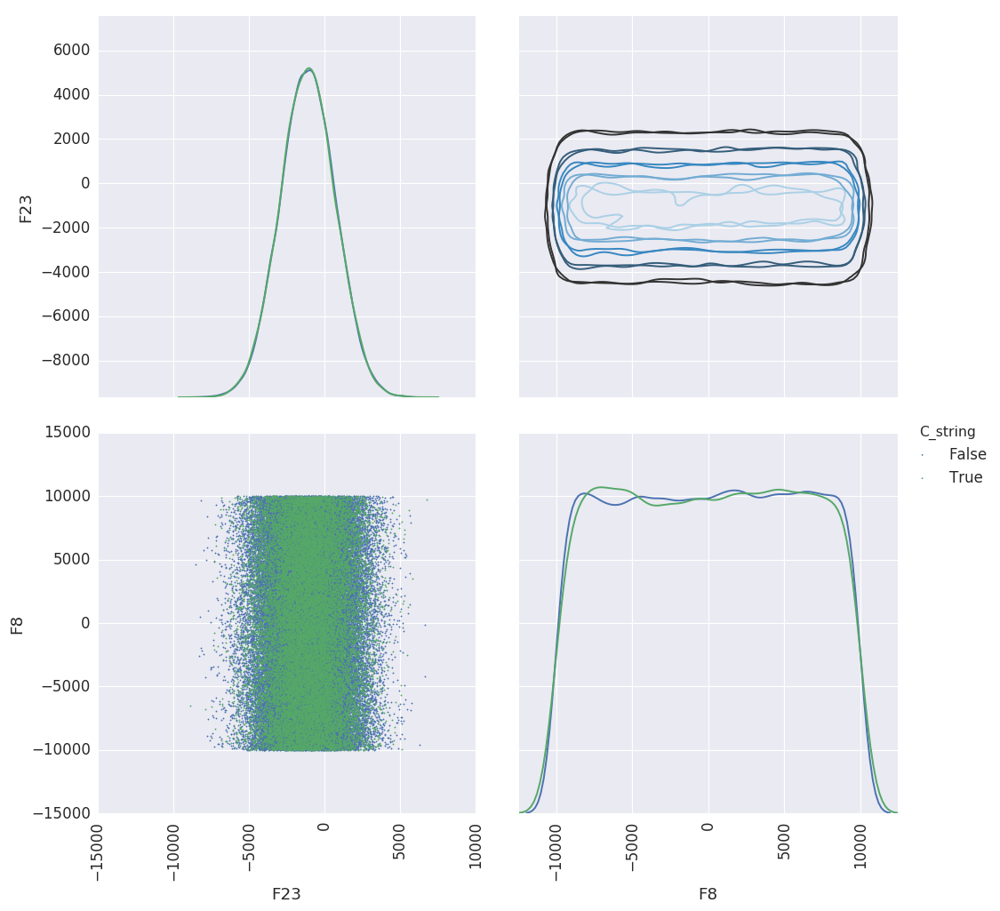

In [43]:
plot_vs_F23("F8")

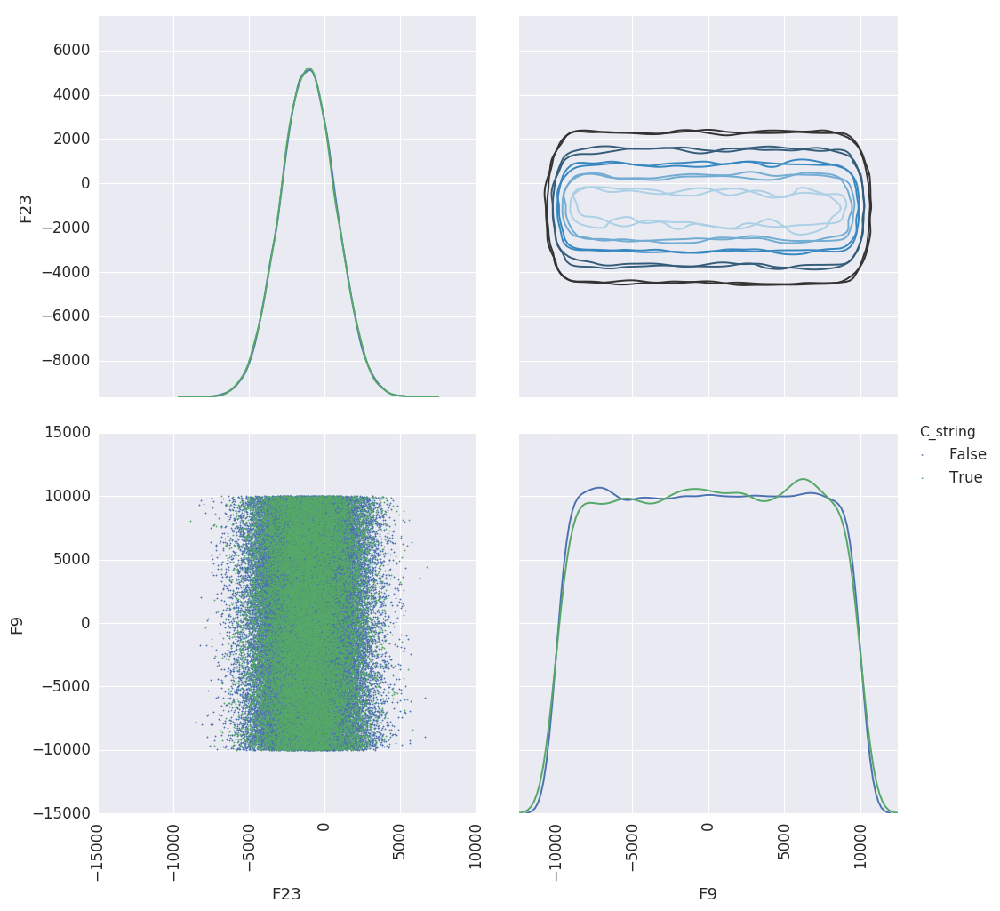

In [44]:
plot_vs_F23("F9")

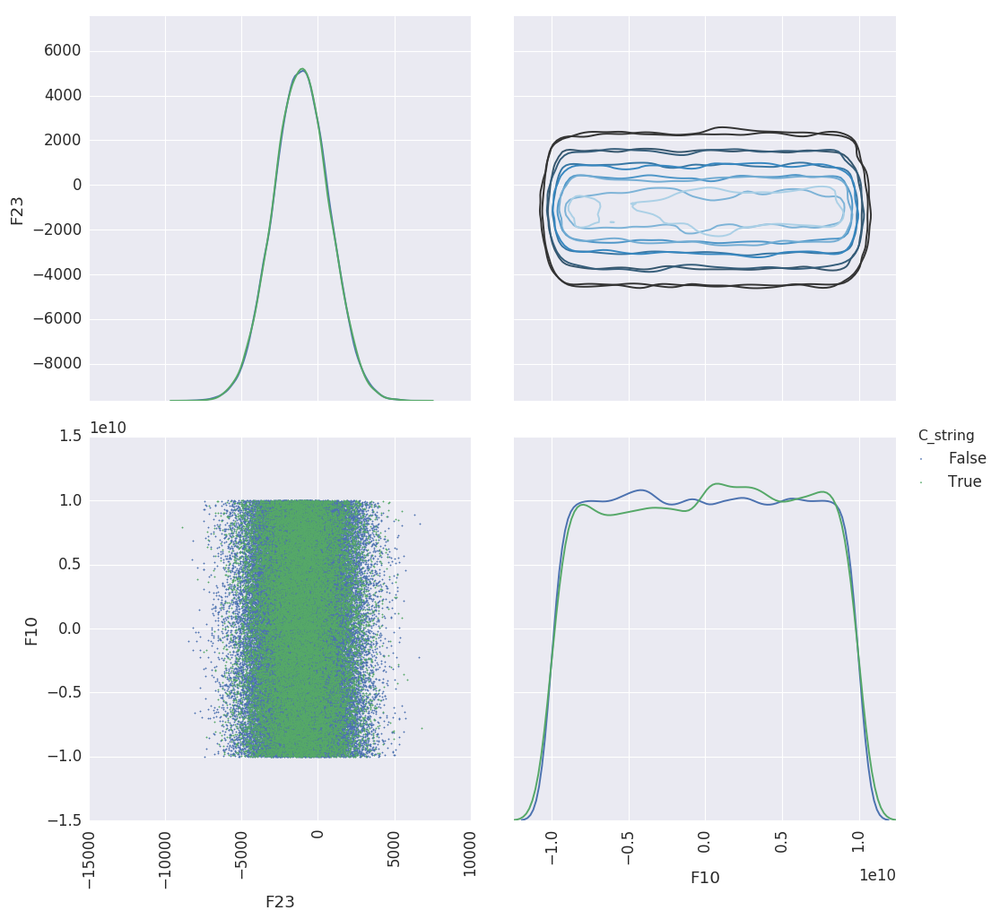

In [45]:
plot_vs_F23("F10")

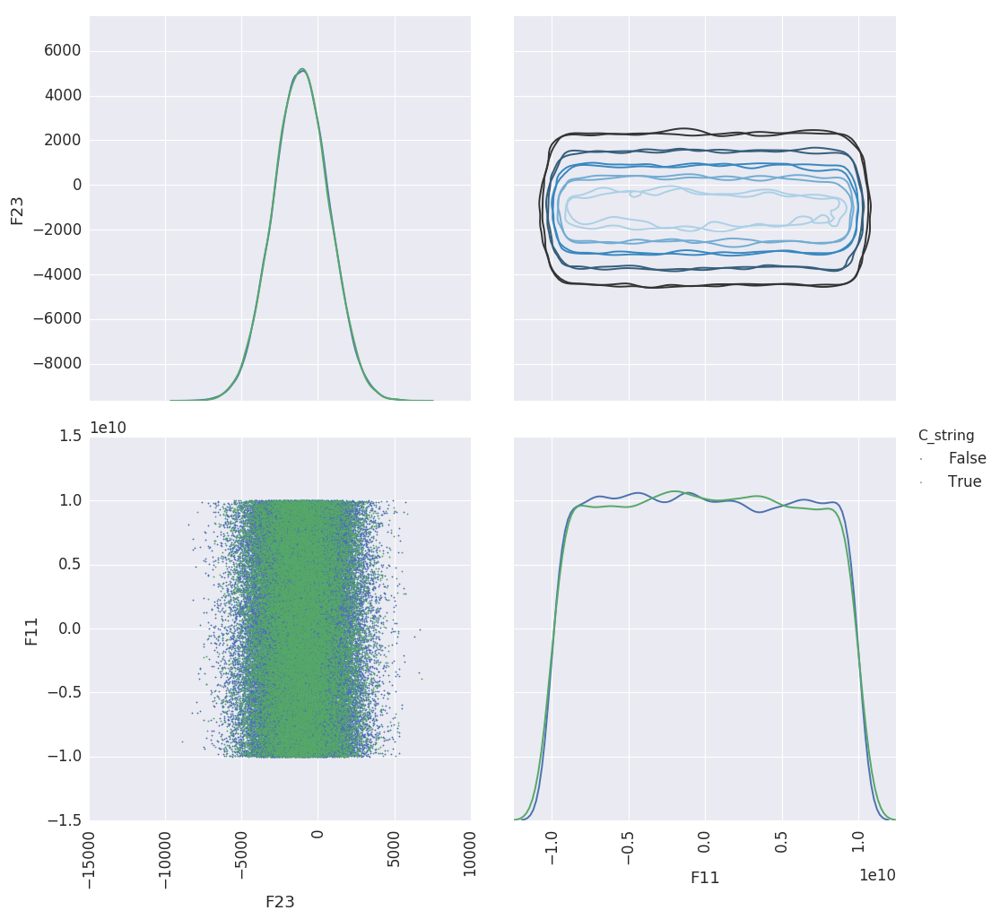

In [46]:
plot_vs_F23("F11")

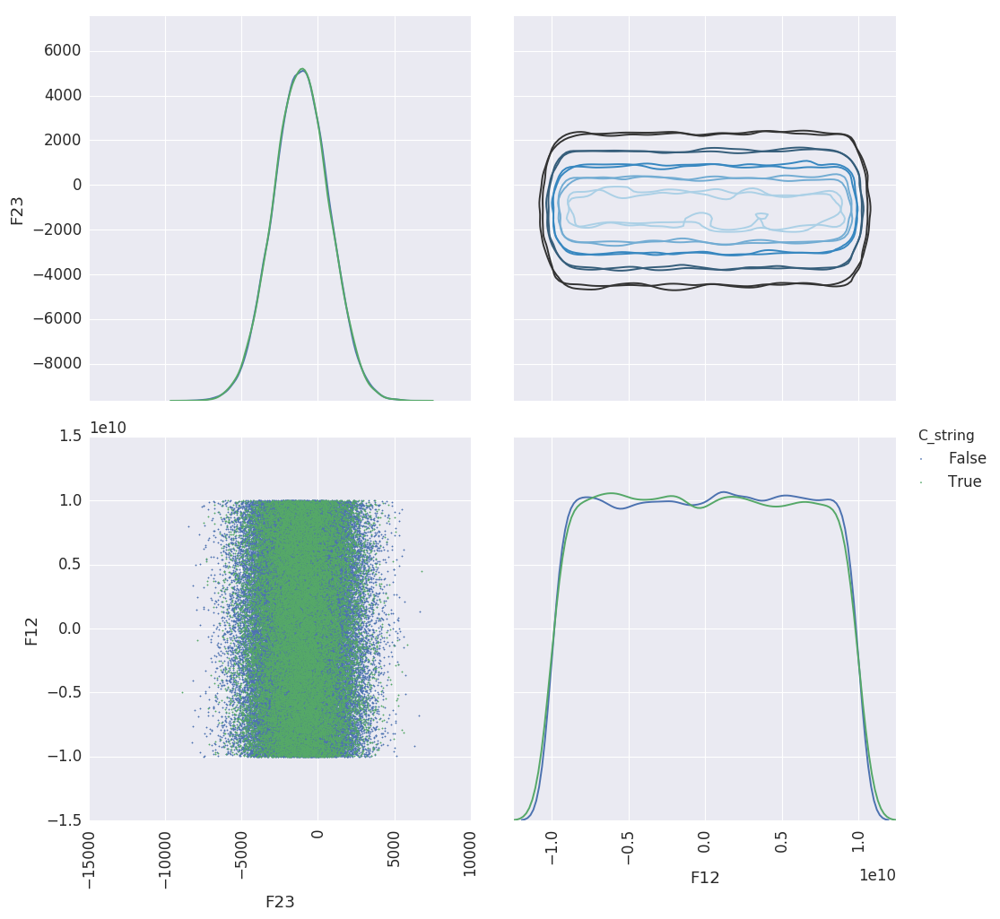

In [47]:
plot_vs_F23("F12")

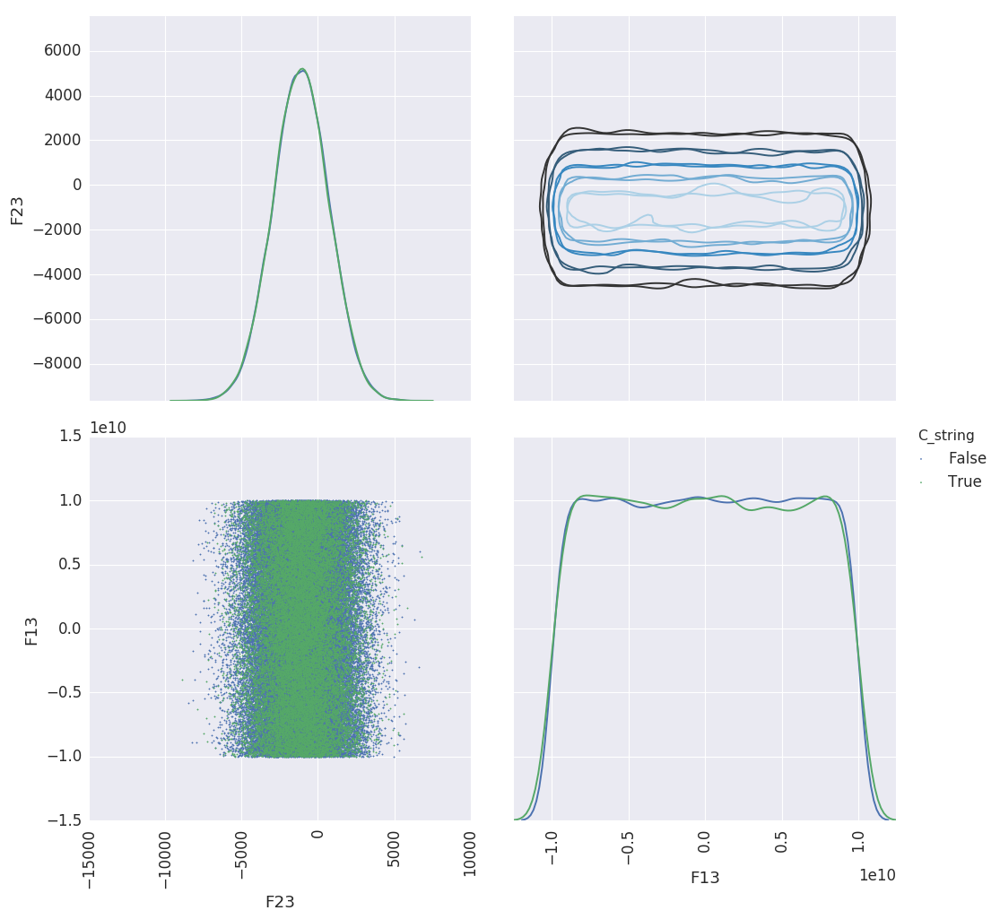

In [48]:
plot_vs_F23("F13")

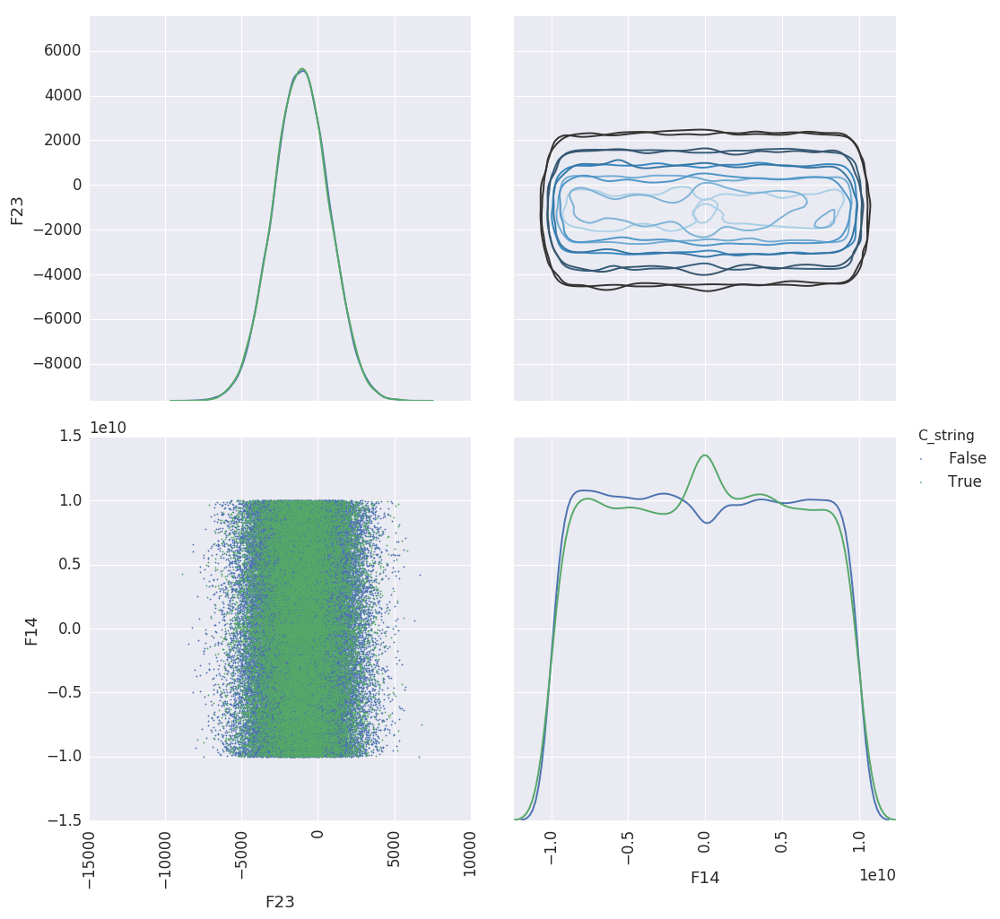

In [49]:
plot_vs_F23("F14")

[2 1 4 6 3]


(array([ 81320.,      0.,  13536.,      0.,   2426.,      0.,   1759.,
             0.,      0.,   2139.]),
 array([ 1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,  6. ]),
 <a list of 10 Patch objects>)

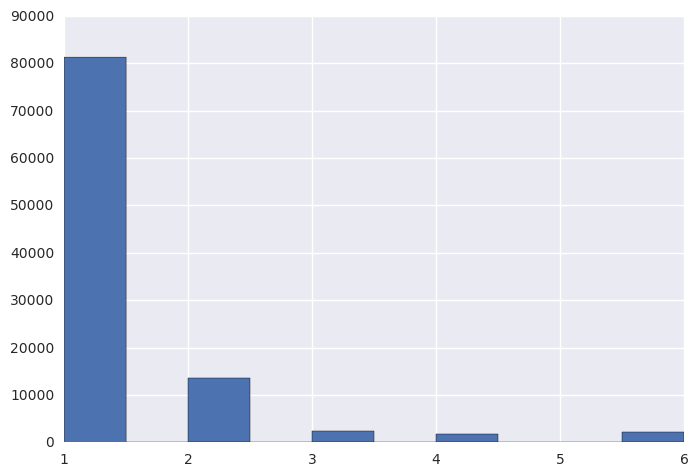

In [69]:
print prob.F17.unique()
plt.hist(prob.F17)

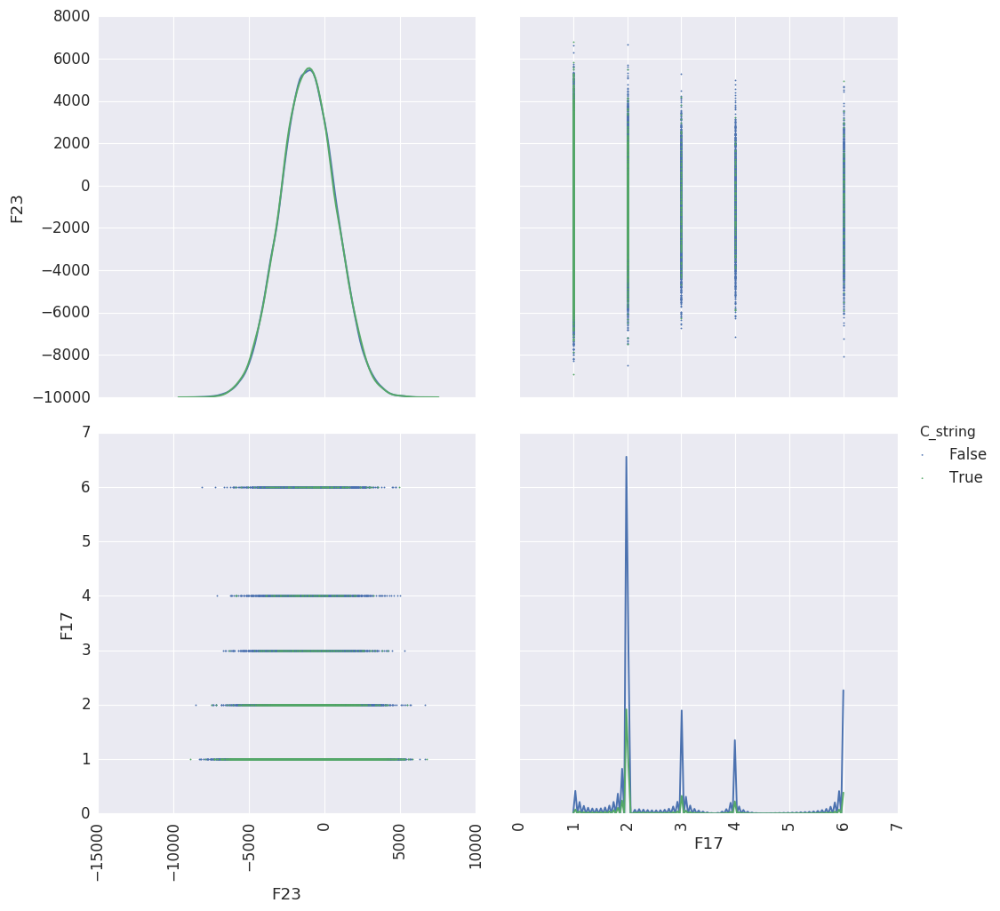

In [58]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F17", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(sns.kdeplot)
#     g = g.map_upper(sns.kdeplot, cmap = "Blues_d")
#     g = g.map_lower(plt.scatter, s=1)
    g = g.map_offdiag(plt.scatter, s=1)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('2317C.jpg')

[1 2 4 6 3]


(array([ 81432.,      0.,  13484.,      0.,   2436.,      0.,   1799.,
             0.,      0.,   2029.]),
 array([ 1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,  6. ]),
 <a list of 10 Patch objects>)

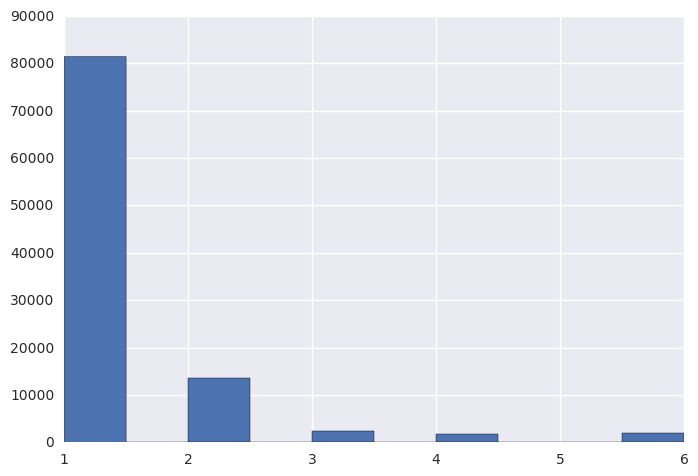

In [68]:
print prob.F18.unique()
plt.hist(prob.F18)

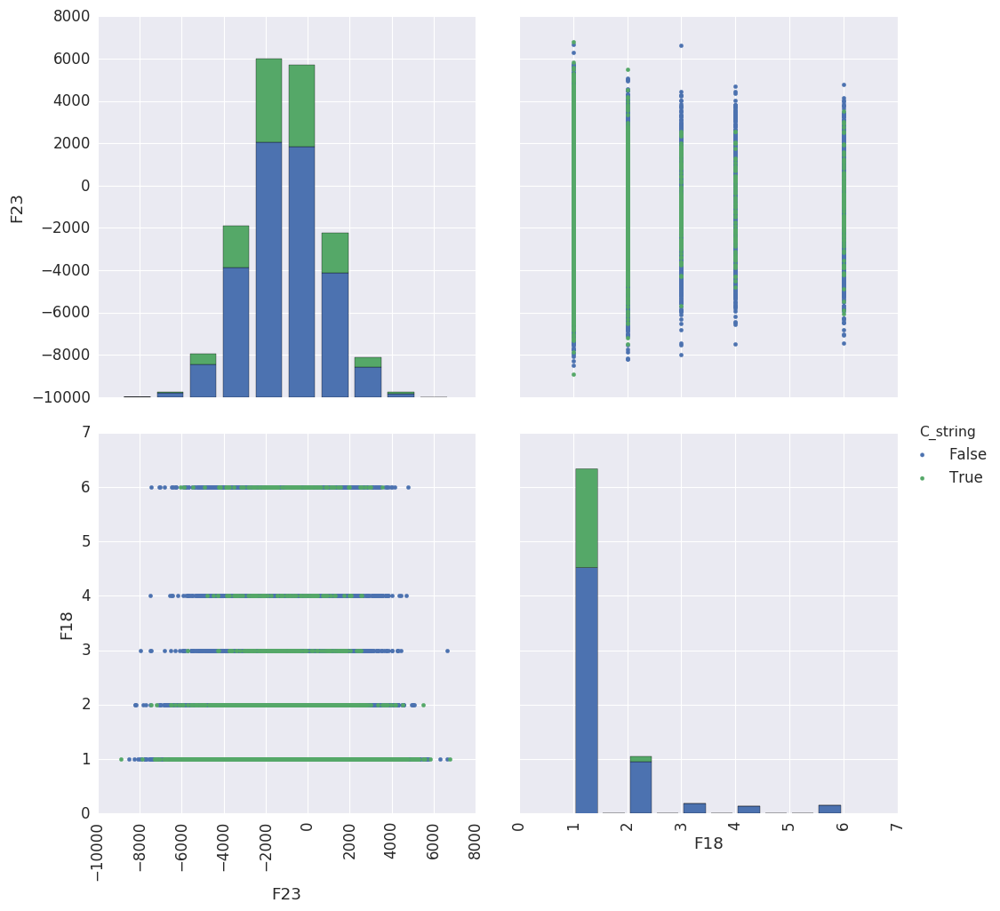

In [6]:
with sns.plotting_context("paper", font_scale=1.5):   
    g = sns.PairGrid(prob[["F23", "F18", "C_string"]], hue="C_string", size=5, diag_sharey=False)
    g = g.map_diag(plt.hist)
#     g = g.map_upper(sns.kdeplot, cmap = "Blues_d")
#     g = g.map_lower(plt.scatter, s=1)
    g = g.map_offdiag(plt.scatter, s=10)
    g.add_legend()
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    g.savefig('2318C.jpg')

In [7]:
prob_data = prob.drop(['F15', 'F16', 'C', 'C_string'], axis = 1)
prob_data.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F12,F13,F14,F17,F18,F19,F20,F21,F22,F23
Index,,,,,,,,,,,,,,,,,,,,,
1,0.224506,0.500340,0.489860,0.902413,7934,-6970,-5714,9982,-5697,4227810299,...,316195953,6176861823,-3433637453,2,1,706,305,1,2,-2164.0
2,0.321128,0.281119,0.907283,0.772159,-8238,1219,1663,1287,-3658,-1146724819,...,1378635942,-9031507610,609277486,1,1,423,206,18,7,-1411.0
3,0.893441,0.622005,0.998776,0.098386,8540,5266,-9377,-3504,-4511,5947184989,...,-9921889287,-5610051842,-8977995005,2,1,703,315,1,4,782.0
4,0.320641,0.957234,0.346000,0.646479,-7772,-383,9681,-8661,3474,-5724795826,...,6550322883,-4697085930,4868760308,1,1,122,304,15,1,-3765.0
5,0.475961,0.623008,0.544988,0.159709,1571,-8039,-7961,-2385,4407,-3097637172,...,759031103,9984692447,9757408267,1,1,486,240,1,1,538.0


In [14]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler

In [15]:
scaler = MinMaxScaler(feature_range=(-1,1))
prob_data_scaled = pd.DataFrame(scaler.fit_transform(prob_data), columns=prob_data.columns)
prob_data_scaled.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F12,F13,F14,F17,F18,F19,F20,F21,F22,F23
0,-0.551010,0.000686,-0.020267,0.804865,0.7934,-0.6970,-0.5714,0.9982,-0.5697,0.422812,...,0.031631,0.617687,-0.343379,-0.6,-1.0,0.566667,-0.324444,-1.0,-0.9,-0.141271
1,-0.357759,-0.437762,0.814592,0.544350,-0.8238,0.1219,0.1663,0.1287,-0.3658,-0.114660,...,0.137878,-0.903165,0.060917,-1.0,-1.0,-0.062222,-0.544444,0.7,-0.4,-0.045176
2,0.786903,0.244021,0.997581,-0.803233,0.8540,0.5266,-0.9377,-0.3504,-0.4511,0.594755,...,-0.992213,-0.561016,-0.897822,-0.6,-1.0,0.560000,-0.302222,-1.0,-0.7,0.234686
3,-0.358734,0.914487,-0.307992,0.292983,-0.7772,-0.0383,0.9681,-0.8661,0.3474,-0.572483,...,0.655065,-0.469718,0.486870,-1.0,-1.0,-0.731111,-0.326667,0.4,-1.0,-0.345584
4,-0.048083,0.246027,0.089991,-0.680585,0.1571,-0.8039,-0.7961,-0.2385,0.4407,-0.309758,...,0.075916,0.998474,0.975741,-1.0,-1.0,0.077778,-0.468889,-1.0,-1.0,0.203548


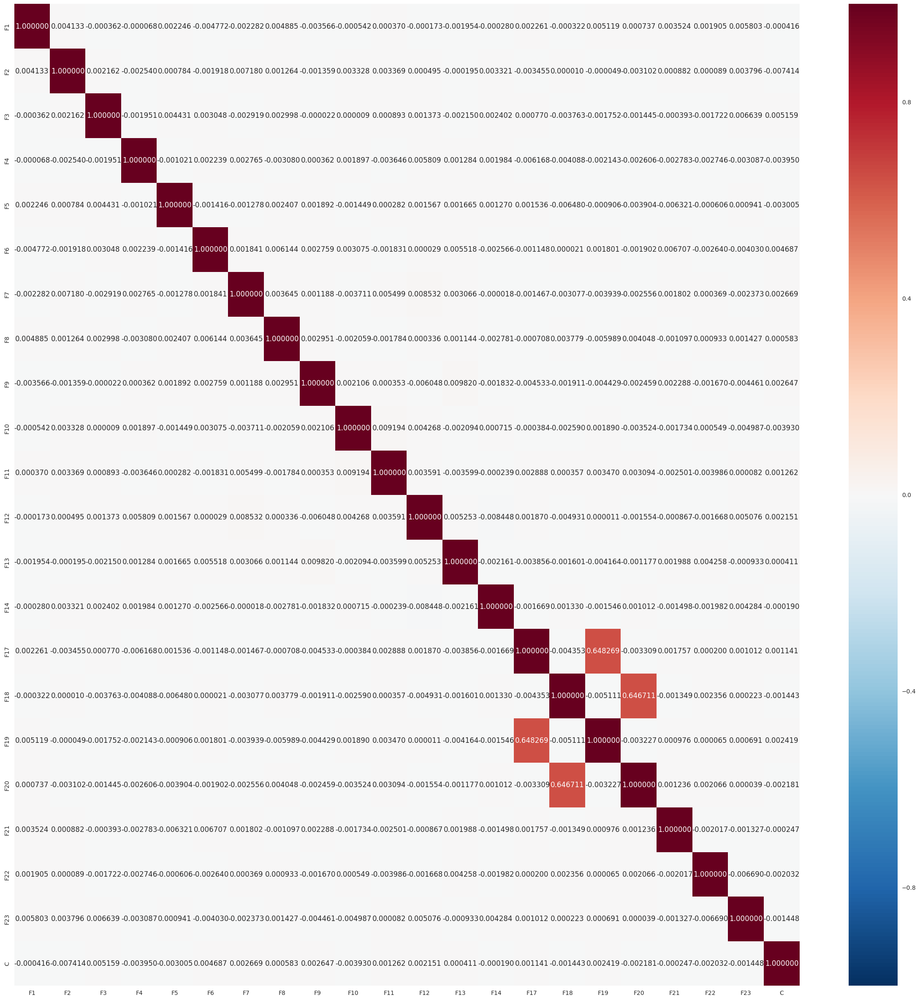

In [38]:
# calculate the correlation matrix
corr = prob_data_scaled.corr()

# plot the heatmap
g = plt.figure(figsize=(30, 30))
g = sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns, annot=True, fmt="f")
fig =g.get_figure()
fig.savefig('scaled_data_corr.jpg')

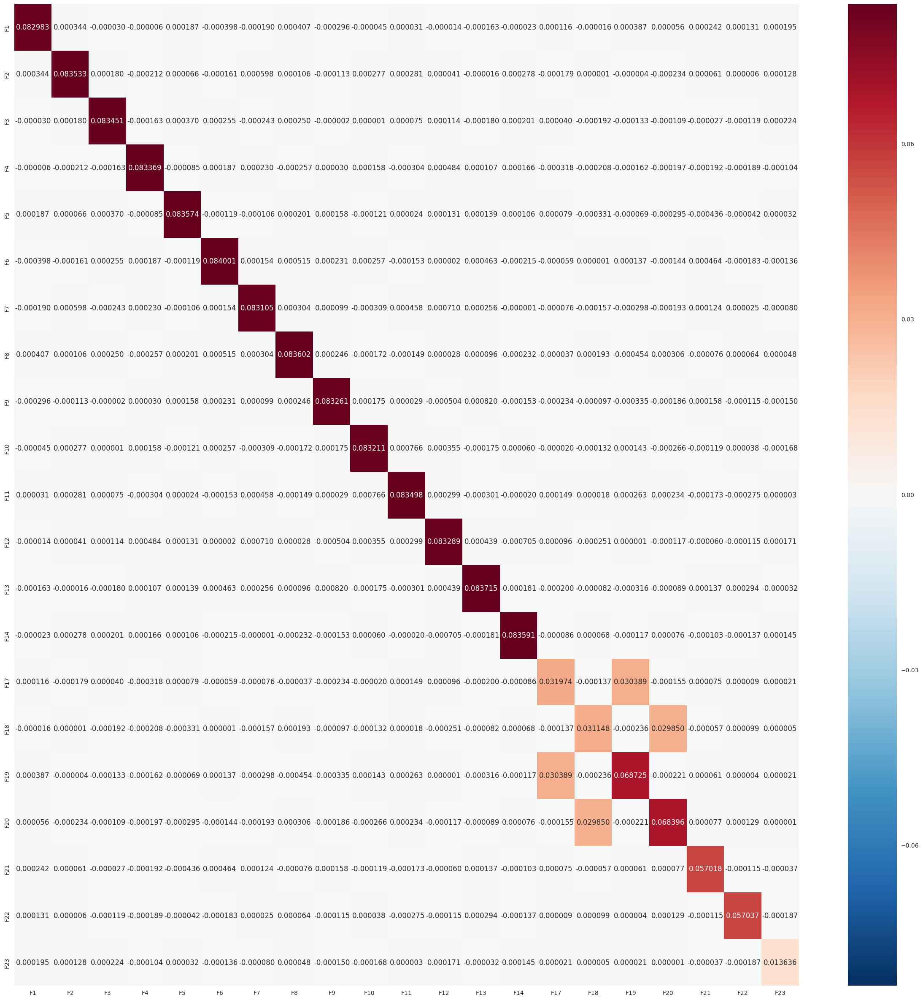

In [28]:
# calculate the covariance matrix
cov = prob_data_scaled.cov()

# plot the heatmap
g = plt.figure(figsize=(30, 30))
g = sns.heatmap(cov, 
        xticklabels=cov.columns,
        yticklabels=cov.columns, annot=True, fmt="f")
fig =g.get_figure()
fig.savefig('scaled_data_cov.jpg')

In [10]:
prob_data_s_target = prob_data_scaled
prob_data_s_target['C'] = prob['C']
prob_data_s_target.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F13,F14,F17,F18,F19,F20,F21,F22,F23,C
0,0.224495,0.500343,0.489867,0.902433,0.89670,0.15150,0.21430,0.99910,0.21515,0.711406,...,0.808844,0.328310,0.2,0.0,0.783333,0.337778,0.00,0.05,0.429364,NaN
1,0.321120,0.281119,0.907296,0.772175,0.08810,0.56095,0.58315,0.56435,0.31710,0.442670,...,0.048418,0.530458,0.0,0.0,0.468889,0.227778,0.85,0.30,0.477412,0.0
2,0.893452,0.622010,0.998791,0.098383,0.92700,0.76330,0.03115,0.32480,0.27445,0.797377,...,0.219492,0.051089,0.2,0.0,0.780000,0.348889,0.00,0.15,0.617343,1.0
3,0.320633,0.957244,0.346004,0.646491,0.11140,0.48085,0.98405,0.06695,0.67370,0.213758,...,0.265141,0.743435,0.0,0.0,0.134444,0.336667,0.70,0.00,0.327208,0.0
4,0.475958,0.623013,0.544996,0.159708,0.57855,0.09805,0.10195,0.38075,0.72035,0.345121,...,0.999237,0.987870,0.0,0.0,0.538889,0.265556,0.00,0.00,0.601774,0.0


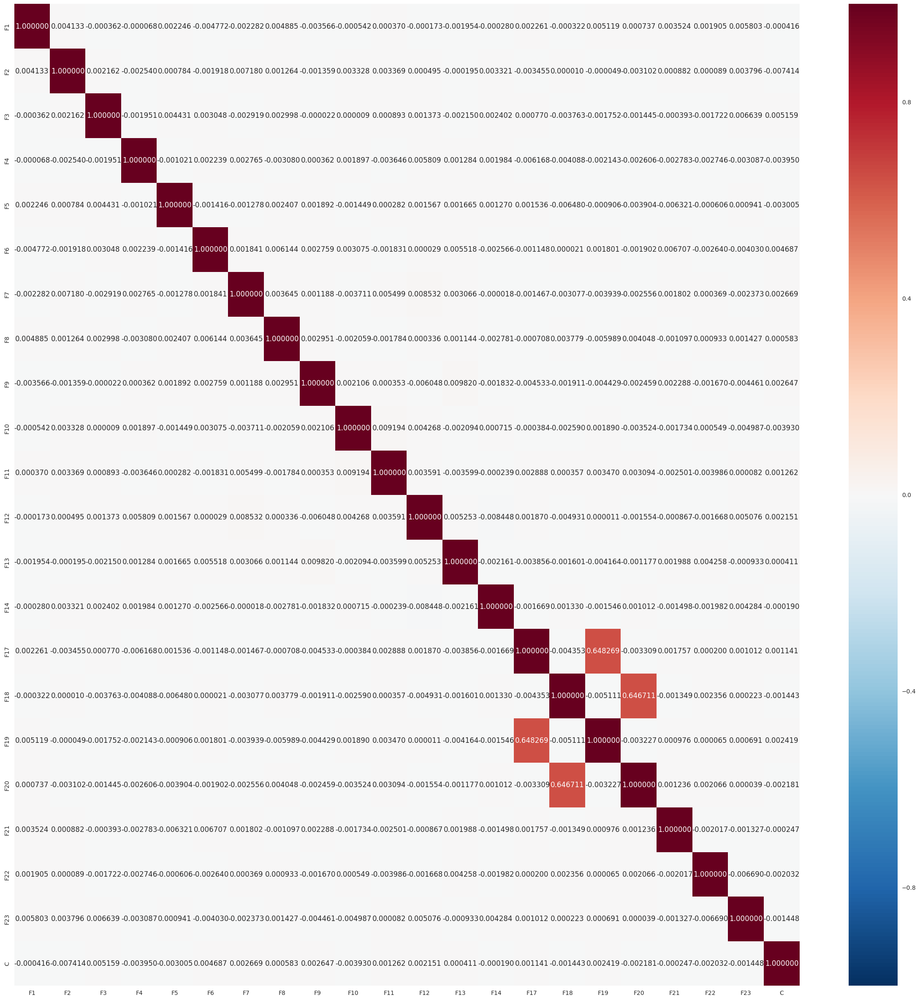

In [39]:
# calculate the correlation matrix
corr = prob_data_s_target.corr()

# plot the heatmap
g = plt.figure(figsize=(30, 30))
g = sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns, annot=True, fmt="f")
fig =g.get_figure()
fig.savefig('scaled_data_target_corr.jpg')

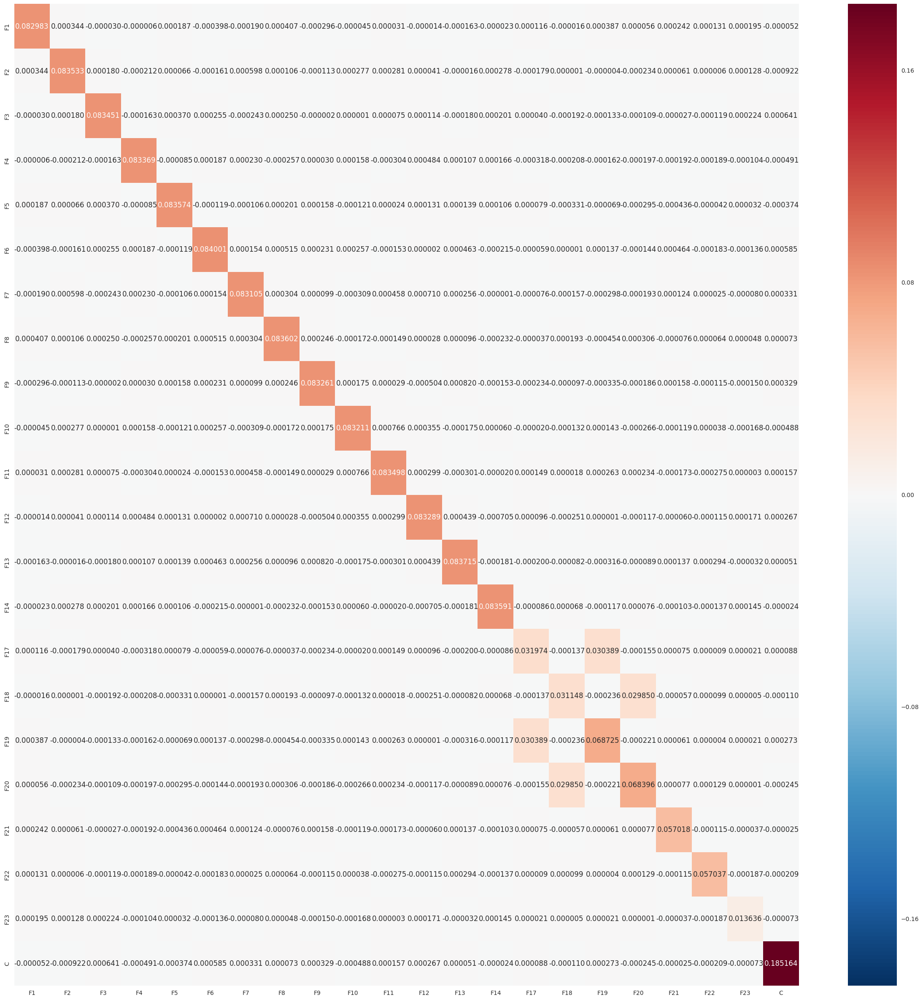

In [41]:
# calculate the correlation matrix
cov = prob_data_s_target.cov()

# plot the heatmap
g = plt.figure(figsize=(30, 30))
g = sns.heatmap(cov, 
        xticklabels=cov.columns,
        yticklabels=cov.columns, annot=True, fmt="f")
fig =g.get_figure()
fig.savefig('scaled_data_target_cov.jpg')

In [11]:
from sklearn.ensemble import RandomForestClassifier

In [12]:
X = prob_data_scaled.values
y = prob.C.values

In [36]:
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X, y)
feature_importance = clf.feature_importances_

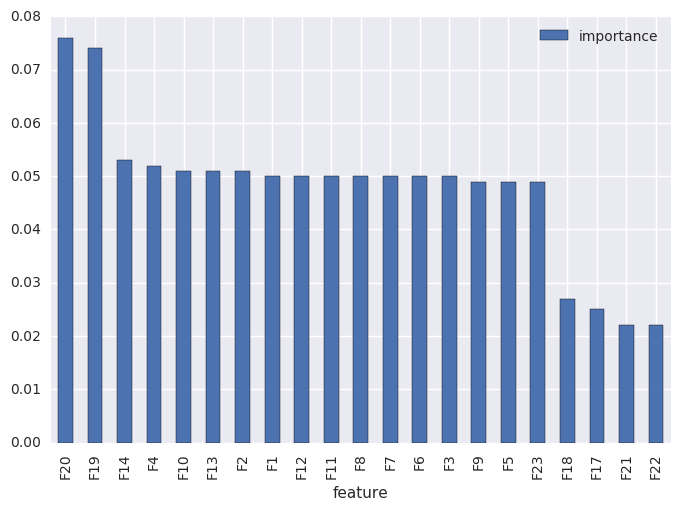

In [39]:
importances = pd.DataFrame({'feature':prob_data_scaled.columns,'importance':np.round(clf.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
g = importances.plot.bar()
fig =g.get_figure()
fig.savefig('feature_importance.jpg')

In [16]:
prob_data_final = prob_data_scaled.drop(['F21', 'F22', 'F18', 'F17'], axis = 1)
prob_data_final.head()

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F19,F20,F23
0,-0.551010,0.000686,-0.020267,0.804865,0.7934,-0.6970,-0.5714,0.9982,-0.5697,0.422812,-0.391878,0.031631,0.617687,-0.343379,0.566667,-0.324444,-0.141271
1,-0.357759,-0.437762,0.814592,0.544350,-0.8238,0.1219,0.1663,0.1287,-0.3658,-0.114660,-0.683724,0.137878,-0.903165,0.060917,-0.062222,-0.544444,-0.045176
2,0.786903,0.244021,0.997581,-0.803233,0.8540,0.5266,-0.9377,-0.3504,-0.4511,0.594755,0.688122,-0.992213,-0.561016,-0.897822,0.560000,-0.302222,0.234686
3,-0.358734,0.914487,-0.307992,0.292983,-0.7772,-0.0383,0.9681,-0.8661,0.3474,-0.572483,-0.601424,0.655065,-0.469718,0.486870,-0.731111,-0.326667,-0.345584
4,-0.048083,0.246027,0.089991,-0.680585,0.1571,-0.8039,-0.7961,-0.2385,0.4407,-0.309758,-0.975592,0.075916,0.998474,0.975741,0.077778,-0.468889,0.203548


In [17]:
X = prob_data_final.values
y = prob.C.values

In [26]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

In [27]:
rfc = RandomForestClassifier()

In [28]:
from sklearn.grid_search import GridSearchCV

Trying out Random Forest Classifier

In [29]:
n_range = range(15, 31)
params_grid = dict(n_estimators=n_range)
print params_grid

{'n_estimators': [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]}


In [ ]:
grid = GridSearchCV(rfc, params_grid, cv=10, scoring='accuracy', n_jobs=-1)

In [ ]:
grid.fit(X_train, y_train)